In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC

%matplotlib inline

In [24]:
pd.read_csv("top_picks_domains.csv").info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4076 entries, 0 to 4075
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   rank        4076 non-null   int64 
 1   domain      4076 non-null   object
 2   host        4076 non-null   object
 3   origin      4076 non-null   object
 4   suffix      4076 non-null   object
 5   categories  4076 non-null   object
dtypes: int64(1), object(5)
memory usage: 191.2+ KB


In [25]:
dfweb = pd.read_csv("kaggle_website_classification.csv")
dfweb.shape

(1392, 4)

In [26]:
dfweb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1392 entries, 0 to 1391
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Unnamed: 0            1392 non-null   int64 
 1   website_url           1392 non-null   object
 2   cleaned_website_text  1392 non-null   object
 3   Category              1392 non-null   object
dtypes: int64(1), object(3)
memory usage: 43.6+ KB


In [5]:
df = dfweb[["website_url", "cleaned_website_text", "Category"]].copy()

In [6]:
pd.DataFrame(df.Category.unique()).values

array([['Travel'],
       ['Social Networking and Messaging'],
       ['News'],
       ['Streaming Services'],
       ['Sports'],
       ['Photography'],
       ['Law and Government'],
       ['Health and Fitness'],
       ['Games'],
       ['E-Commerce'],
       ['Forums'],
       ['Food'],
       ['Education'],
       ['Computers and Technology'],
       ['Business/Corporate']], dtype=object)

In [7]:
df.head()

,website_url,cleaned_website_text,Category
0,https://www.booking.com/index.html?aid=1743217,official site good hotel accommodation big sav...,Travel
1,https://travelsites.com/expedia/,expedia hotel book sites like use vacation wor...,Travel
2,https://travelsites.com/tripadvisor/,tripadvisor hotel book sites like previously d...,Travel
3,https://www.momondo.in/?ispredir=true,cheap flights search compare flights momondo f...,Travel
4,https://www.ebookers.com/?AFFCID=EBOOKERS-UK.n...,bot create free account create free account si...,Travel


In [8]:
df['category_id'] = df['Category'].factorize()[0]
category_id_df = df[['Category', 'category_id']].drop_duplicates()


# Dictionaries for future use
category_to_id = dict(category_id_df.values)
id_to_category = dict(category_id_df[['category_id', 'Category']].values)

# Helper to store all the unique categories
unique_categories = list(category_to_id.keys())

# New dataframe
df.head()

,website_url,cleaned_website_text,Category,category_id
0,https://www.booking.com/index.html?aid=1743217,official site good hotel accommodation big sav...,Travel,0
1,https://travelsites.com/expedia/,expedia hotel book sites like use vacation wor...,Travel,0
2,https://travelsites.com/tripadvisor/,tripadvisor hotel book sites like previously d...,Travel,0
3,https://www.momondo.in/?ispredir=true,cheap flights search compare flights momondo f...,Travel,0
4,https://www.ebookers.com/?AFFCID=EBOOKERS-UK.n...,bot create free account create free account si...,Travel,0


## Show High-frequency Words via Wordcloud Charts 

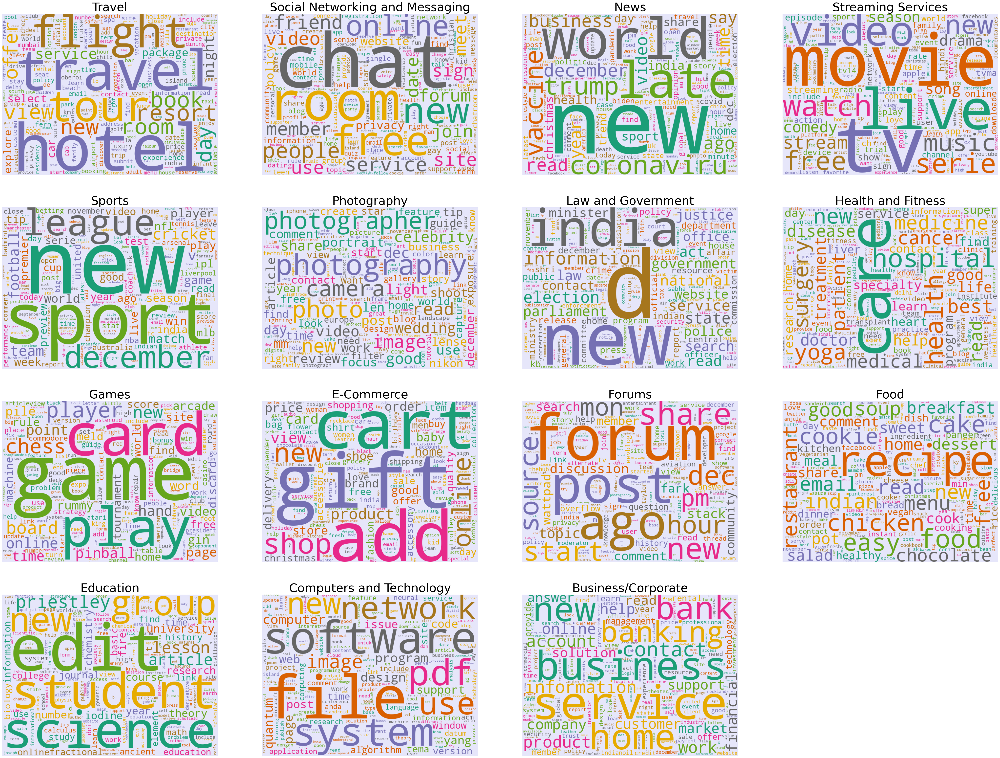

In [91]:
from wordcloud import WordCloud, STOPWORDS

plt.figure(figsize=(60,45))
for i, category in enumerate(category_to_id.keys(), start=1):
    df_parts = df[df.Category == category]
    texts = df_parts.cleaned_website_text.values
    wcloud = WordCloud(
        stopwords=STOPWORDS,
        background_color="lavender",
        colormap="Dark2",
        collocations=False,
        width=800,
        height=600
    ).generate(" ".join(texts))
    plt.subplot(4, 4, i)
    plt.axis("off")
    plt.title(category, fontsize=40)
    plt.imshow(wcloud, interpolation="bilinear")
plt.show()

## Vectorize the raw text via TF-IDF with Uni-Gram and Bi-Gram 

In [9]:
tfidf = TfidfVectorizer(
    sublinear_tf=True,
    min_df=5,
    ngram_range=(1, 2), 
    stop_words='english'
)

# We transform each cleaned_text into a vector
features = tfidf.fit_transform(df.cleaned_website_text).toarray()

labels = df.category_id

print(f"Each of the %d text is represented by {features.shape} features (TF-IDF score of unigrams and bigrams)")

Each of the %d text is represented by (1392, 18540) features (TF-IDF score of unigrams and bigrams)


In [27]:
# Finding the three most correlated terms with each of the categories via Chi Square Statistic
N = 3
for Category, category_id in sorted(category_to_id.items()):
  features_chi2 = chi2(features, labels == category_id)
  indices = np.argsort(features_chi2[0])
  feature_names = np.array(tfidf.get_feature_names_out())[indices]
  unigrams = [v for v in feature_names if len(v.split(' ')) == 1]
  bigrams = [v for v in feature_names if len(v.split(' ')) == 2]
  print("\n==> %s:" %(Category))
  print("  * Most Correlated Unigrams are: %s" %(', '.join(unigrams[-N:])))
  print("  * Most Correlated Bigrams are: %s" %(', '.join(bigrams[-N:])))


==> Business/Corporate:
  * Most Correlated Unigrams are: accounting, investment, banking
  * Most Correlated Bigrams are: home products, real estate, online banking

==> Computers and Technology:
  * Most Correlated Unigrams are: file, windows, software
  * Most Correlated Bigrams are: programming language, web hosting, source code

==> E-Commerce:
  * Most Correlated Unigrams are: accessory, accessories, shipping
  * Most Correlated Bigrams are: online shopping, add cart, free shipping

==> Education:
  * Most Correlated Unigrams are: biology, university, chemistry
  * Most Correlated Bigrams are: earth science, periodic table, open access

==> Food:
  * Most Correlated Unigrams are: cake, recipes, recipe
  * Most Correlated Bigrams are: instant pot, order online, gluten free

==> Forums:
  * Most Correlated Unigrams are: redirect, answers, forums
  * Most Correlated Bigrams are: general discussion, search forum, share knowledge

==> Games:
  * Most Correlated Unigrams are: games, c

In [28]:
X = df['cleaned_website_text'] # Collection of text
y = df['Category'] # Target or the labels we want to predict

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 0)

In [29]:
from sklearn.linear_model import SGDClassifier

models = [
    # Random Forest
    RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42),
    # Linear SVM Classier
    LinearSVC(dual="auto"),
    # Multinomial Gaussian Naive Bayesian
    MultinomialNB(),
    # SGD with Logistic Regressor
    SGDClassifier(loss="log_loss")
]

# 10 Cross-validation, this will take a while to run
CV = 10
cv_df = pd.DataFrame(index=range(CV * len(models)))

entries = []
for model in models:
  model_name = model.__class__.__name__
  accuracies = cross_val_score(model, features, labels, scoring='accuracy', cv=CV)
  for fold_idx, accuracy in enumerate(accuracies):
    entries.append((model_name, fold_idx, accuracy))

cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_idx', 'accuracy'])
cv_df

,model_name,fold_idx,accuracy
0,RandomForestClassifier,0,0.700000
1,RandomForestClassifier,1,0.764286
2,RandomForestClassifier,2,0.805755
3,RandomForestClassifier,3,0.640288
4,RandomForestClassifier,4,0.762590
5,RandomForestClassifier,5,0.733813
6,RandomForestClassifier,6,0.812950
7,RandomForestClassifier,7,0.748201
8,RandomForestClassifier,8,0.733813
9,RandomForestClassifier,9,0.618705


In [13]:
mean_accuracy = cv_df.groupby('model_name').accuracy.mean()
std_accuracy = cv_df.groupby('model_name').accuracy.std()

acc = pd.concat([mean_accuracy, std_accuracy], axis= 1, 
          ignore_index=True)
acc.columns = ['Mean Accuracy', 'Standard deviation']
acc

,Mean Accuracy,Standard deviation
model_name,,
LinearSVC,0.914538,0.041023
MultinomialNB,0.876470,0.045658
RandomForestClassifier,0.732040,0.063693
SGDClassifier,0.910231,0.041811


In [31]:
X_train, X_test, y_train, y_test,indices_train,indices_test = (
    train_test_split(
        features, 
        labels, 
        df.index, test_size=0.33, 
        random_state=1
    )
)

model = LinearSVC(dual="auto")
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
calibrated_svc = CalibratedClassifierCV(estimator=model,
                                        cv="prefit")

calibrated_svc.fit(X_train,y_train)
predicted = calibrated_svc.predict(X_test)
print(metrics.accuracy_score(y_test, predicted))

0.9217391304347826


In [32]:
print(metrics.classification_report(y_test, predicted, labels=range(1,16), target_names=unique_categories, zero_division=1.0))

                                 precision    recall  f1-score   support

                         Travel       0.87      0.87      0.87        23
Social Networking and Messaging       0.88      0.94      0.91        32
                           News       1.00      0.94      0.97        36
             Streaming Services       0.97      0.97      0.97        37
                         Sports       0.87      0.96      0.92        28
                    Photography       0.93      0.96      0.94        26
             Law and Government       0.90      0.95      0.93        40
             Health and Fitness       0.93      0.90      0.92        31
                          Games       0.94      0.89      0.91        35
                     E-Commerce       1.00      0.00      0.00         3
                         Forums       0.87      1.00      0.93        26
                           Food       1.00      0.91      0.95        45
                      Education       0.93      0.

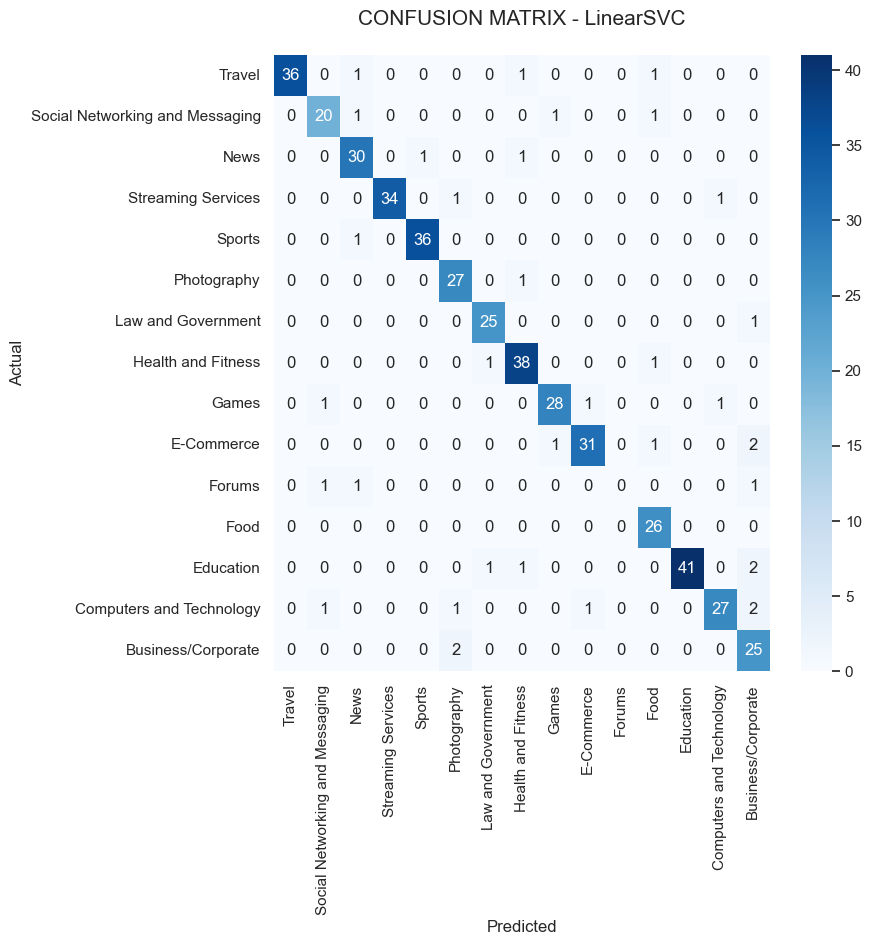

In [33]:
# Confusion Matrics
conf_mat = confusion_matrix(y_test, predicted,labels=range(15))
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(conf_mat, annot=True, cmap="Blues", fmt='d',
            xticklabels=category_id_df.Category.values, 
            yticklabels=category_id_df.Category.values)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title("CONFUSION MATRIX - LinearSVC\n", size=15);

## Predict Using the Top Picks Data (Use `title` as Input) 

In [17]:
import json

with open("top_picks.json") as f:
    tp = json.load(f)

tp = pd.DataFrame(tp["domains"])
tp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 745 entries, 0 to 744
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   rank        745 non-null    int64 
 1   domain      745 non-null    object
 2   categories  745 non-null    object
 3   url         745 non-null    object
 4   title       745 non-null    object
 5   icon        745 non-null    object
dtypes: int64(1), object(5)
memory usage: 35.1+ KB


In [34]:
# Skip the Top-10 as They are Boring 
title_tp = tp[20:30].title
# predicts = calibrated_svc.predict(features_tp)
for i, title in enumerate(title_tp.values):
    features_tp = tfidf.transform(title_tp.iloc[[i]])
    predict = calibrated_svc.predict(features_tp)
    print(f"\n{title} => {id_to_category[predict[0]]}")
    probs = pd.DataFrame(calibrated_svc.predict_proba(features_tp)*100, columns=unique_categories).T
    probs.columns=['Probability']
    probs.index.name='Category'
    a=probs.sort_values(['Probability'],ascending=False)
    a['Probability']=a['Probability'].apply(lambda x:round(x,2))
    print(a)



MSN => Photography
                                 Probability
Category                                    
Photography                            13.70
Business/Corporate                     11.43
Games                                   9.66
Social Networking and Messaging         7.40
Computers and Technology                7.01
Education                               6.68
Food                                    6.41
Sports                                  5.93
Law and Government                      5.71
Streaming Services                      5.09
Travel                                  5.08
Health and Fitness                      4.99
E-Commerce                              4.61
News                                    3.52
Forums                                  2.78

WhatsApp | Secure and Reliable Free Private Messaging and Calling => Social Networking and Messaging
                                 Probability
Category                                    
Social Networking and M

# 🔬🔭 Now Let's Build Lightweight Classifiers via Bloom Filters 

In [35]:
import csv
import pandas as pd
import tldextract as tld
from rbloom import Bloom

# Categories in interest
CATEGORIES: list[str] = [
    "Sports",
    "Economy & Finance",
    "Ecommerce",
    "Travel",
    "Information Technology",
    "News & Media",
    "Chat",
    "Photography",
    "Social Networks",
    "Instant Messengers",
    "Business",
    "Health & Fitness",
    "Music",
    "Home & Garden",
    "Science",
    "Fashion",
    "Technology",
    "Food & Drink",
    "Video Streaming",
    "Education",
    "Lifestyle",
    "Cartoons & Anime",
    "Gaming",
    "Magazines",
    "Forums",
    "Entertainment",
    "Clothing",
    "Weather",
    "Government",
]

# Mapping to unify categories across the sources 
MAPPING: dict[str, str] = {
    "Sports": "Sports",
    "Travel": "Travel",
    "Social Networking and Messaging": "Social Networks",
    "News": "News & Media",
    "Streaming Services": "Video Streaming",
    "Photography": "Photography",
    "Law and Government": "Government",
    "Health and Fitness": "Health & Fitness",
    "Games": "Gaming",
    "Forums": "Forums",
    "E-Commerce": "Ecommerce",
    "Food": "Food & Drink",
    "Education": "Education",
    "Computers and Technology": "Technology",
    "Business/Corporate": "Business",
}

def load_data():
    with open("top_picks_domains.csv") as f:
        csv_reader = csv.DictReader(f)
        for record in csv_reader:
            for category in record["categories"].split(","):
                category = category.strip("[] ")
                if category in CATEGORIES:
                    yield category, record["domain"]

    df = pd.read_csv("kaggle_website_classification.csv")
    for record in df.to_dict(orient="records"):
        yield MAPPING[record["Category"]], tld.extract(
            record["website_url"]
        ).registered_domain


if __name__ == "__main__":
    filters = dict((category, Bloom(5000, 0.01)) for category in CATEGORIES)

    n = 0
    for category, domain in load_data():
        filters[category].add(domain)
        n += 1
    print(f"Total URLs loaded: {n}")

    for cat, filter in filters.items():
        print(f"Estimated unique URLs for '{cat}': {round(filter.approx_items)}")

Total URLs loaded: 5800
Estimated unique URLs for 'Sports': 229
Estimated unique URLs for 'Economy & Finance': 216
Estimated unique URLs for 'Ecommerce': 467
Estimated unique URLs for 'Travel': 221
Estimated unique URLs for 'Information Technology': 154
Estimated unique URLs for 'News & Media': 742
Estimated unique URLs for 'Chat': 4
Estimated unique URLs for 'Photography': 129
Estimated unique URLs for 'Social Networks': 110
Estimated unique URLs for 'Instant Messengers': 15
Estimated unique URLs for 'Business': 365
Estimated unique URLs for 'Health & Fitness': 200
Estimated unique URLs for 'Music': 47
Estimated unique URLs for 'Home & Garden': 21
Estimated unique URLs for 'Science': 22
Estimated unique URLs for 'Fashion': 83
Estimated unique URLs for 'Technology': 437
Estimated unique URLs for 'Food & Drink': 170
Estimated unique URLs for 'Video Streaming': 531
Estimated unique URLs for 'Education': 543
Estimated unique URLs for 'Lifestyle': 3
Estimated unique URLs for 'Cartoons & An

# 🔎🔮 Scan High Frecency URLs in Places and Classify Them

In [23]:
import sqlite3
from collections import Counter

from ipywidgets import interact, IntSlider
from IPython.display import display

def load_places(nurls):
    con = sqlite3.connect("places/nightly-places.sqlite")
    cursor = con.cursor()
    res = cursor.execute(
    """
        SELECT
          title,
          url
        FROM
          moz_places
        ORDER BY
          frecency DESC
        LIMIT
          ?
    """,
        [nurls]
    )
    for record in res.fetchall():
        yield record[0], tld.extract(record[1]).registered_domain

def classify_and_plot(nurls):
    counters = Counter(CATEGORIES)
    for title, url in load_places(nurls):
        for category, filter in filters.items():
            if url in filter:
                counters[category] += 1
    
    fig, ax = plt.subplots(figsize=(16, 8))
    sns.despine(fig)
    sns.set_theme(style="whitegrid")
    cnt_df = pd.DataFrame(counters.most_common(10), columns=['Category', 'URL Count'])
    sns.barplot(cnt_df, y="Category", x="URL Count", palette="hls", hue="URL Count", legend=False)
    plt.title(f"Scanned {nurls} Top Frecency URLs in Places\n", size=15);

slider = IntSlider(
    value=50,
    min=50,
    max=1000,
    step=50,
    description='Top N URLs:',
    disabled=False,
    continuous_update=True,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)
interact(classify_and_plot, nurls=slider)

interactive(children=(IntSlider(value=50, description='Top N URLs:', max=1000, min=50, step=50), Output()), _d…

<function __main__.classify_and_plot(nurls)>